In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/moo_and_mcmc/dream')

In [3]:
traces = {}
for trace in ['a']:
    traces[trace] = [np.load('earm_mtdreamzs_3chain_uniform_filledhistory.15_10000iter2_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_mtdreamzs_3chain_uniform_filledhistory.15_10000iter2_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a']:
    logps[trace] = [np.load('earm_mtdreamzs_3chain_uniform_filledhistory.15_10000iter_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_mtdreamzs_3chain_uniform_filledhistory.15_10000iter_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[ 104.18199224]
 [ 106.85640631]
 [ 106.94162225]
 ..., 
 [ 107.58519284]
 [ 107.03127203]
 [ 107.03127203]]
Logp of trace:  a  chain:  1  =  [ 106.75332431]
Logp of trace:  a  chain:  2  =  [ 105.88142424]


In [5]:
traces['a'][0][:,72]

array([  6.15609273,   6.1723871 ,   6.18206043, ...,  11.12370863,
        11.12370863,  11.12370863])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  82  of  105  parameters.
Percent of parameters with GR below 1.2:  78.0952380952
Number of parameters with GR below 1.1:  55  of  105  parameters.
Percent of parameters with GR below 1.1:  52.380952381


[82, 78.0952380952381, 55, 52.38095238095239]

10000
3
10000


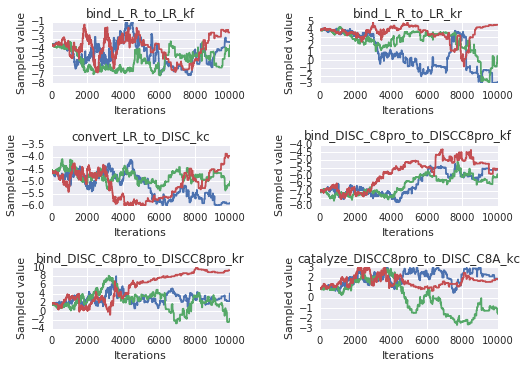

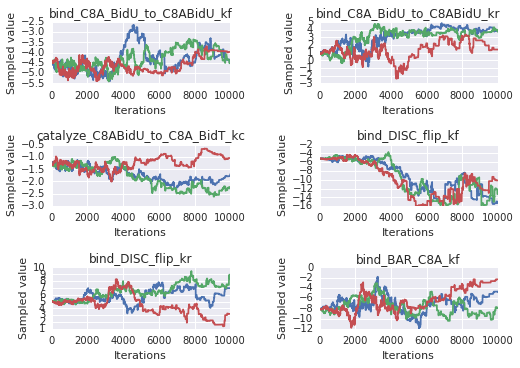

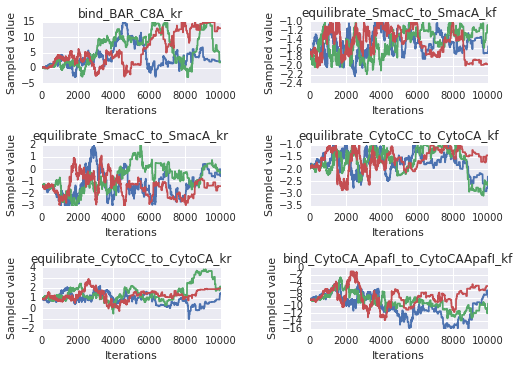

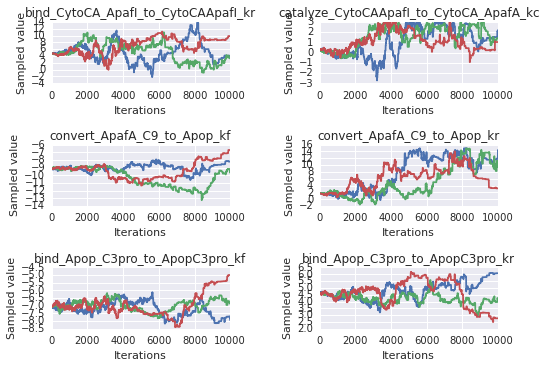

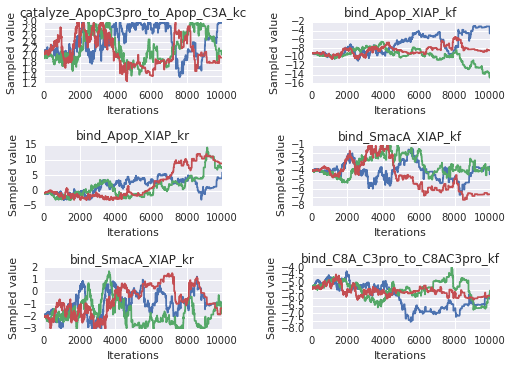

...

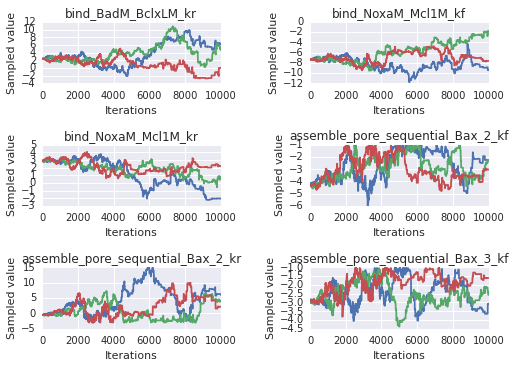

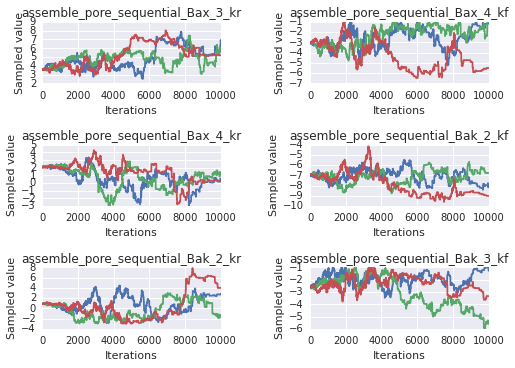

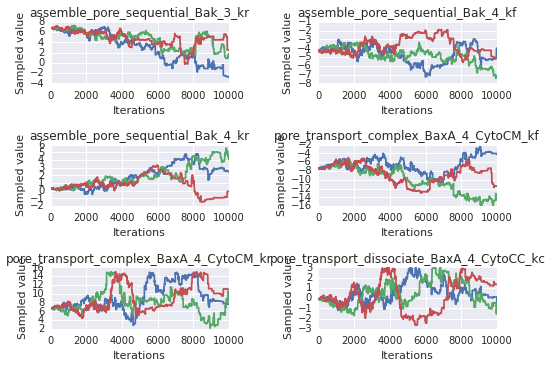

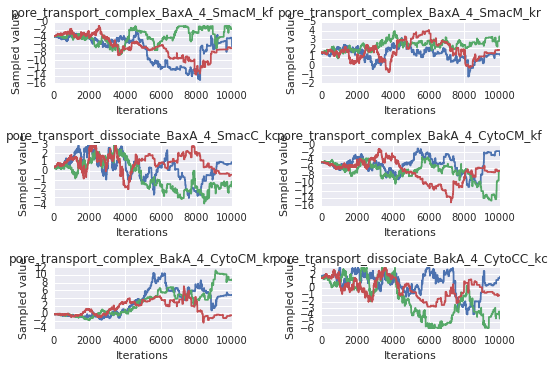

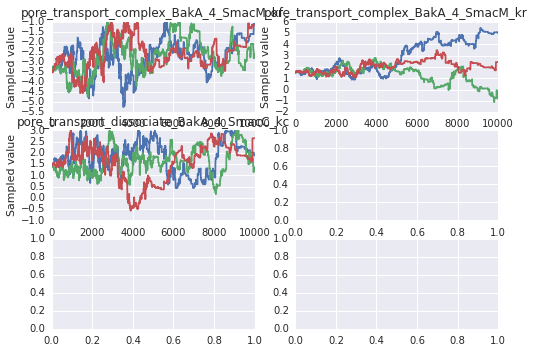

In [8]:
sample_plots(param_trace_dicts['a'])

In [9]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=5000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


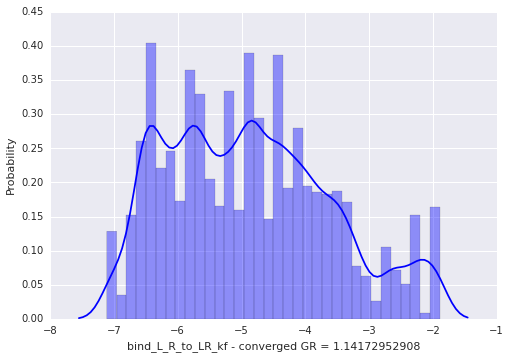

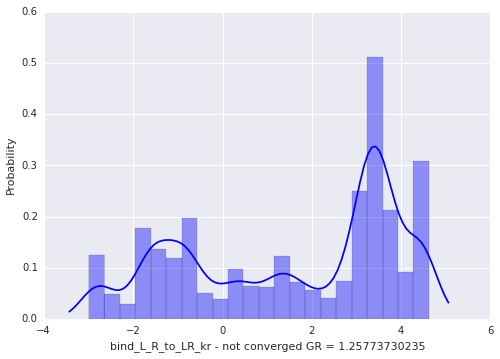

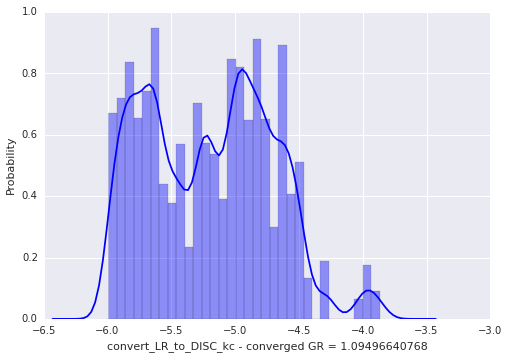

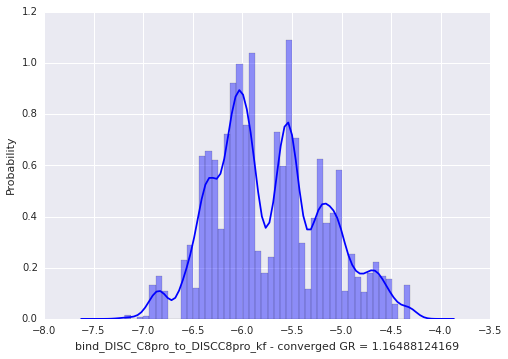

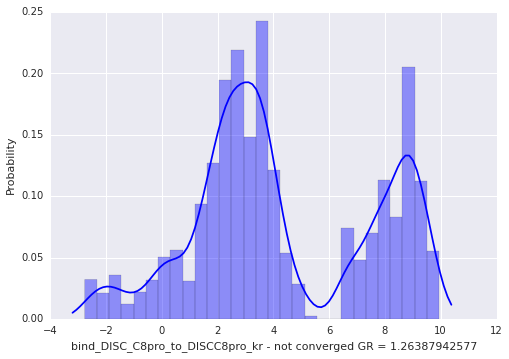

...

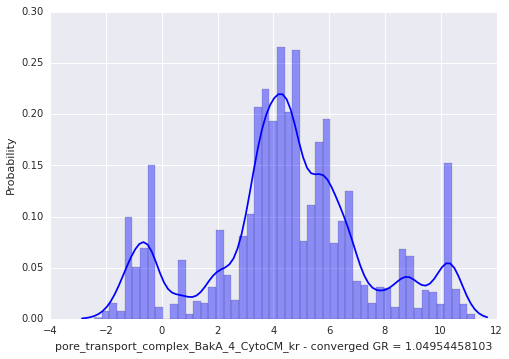

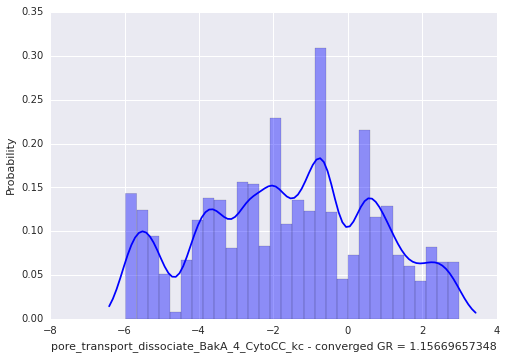

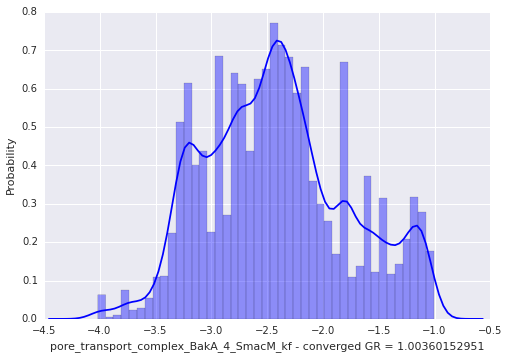

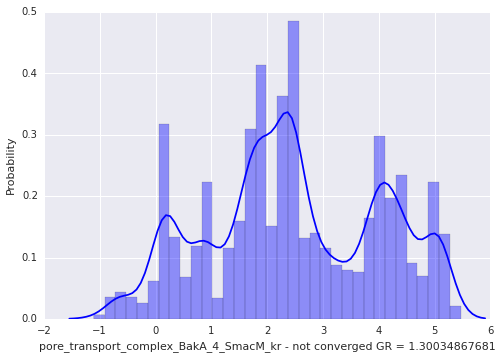

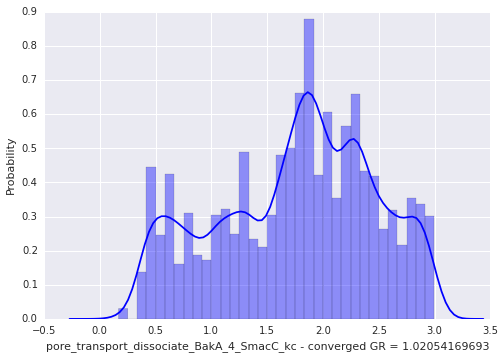

In [10]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [11]:
traces['a'][1][:,0]

array([-3.62801375, -3.63172916, -3.62961489, ..., -3.65303961,
       -3.65303961, -3.65303961])

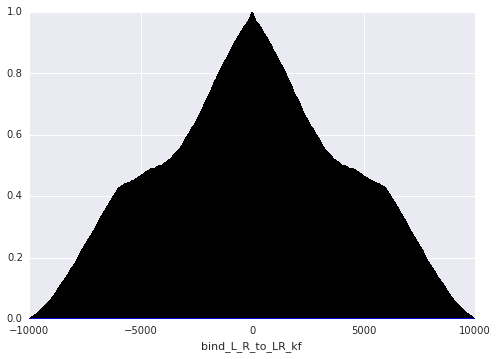

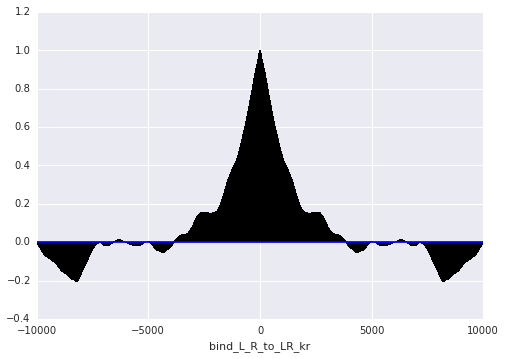

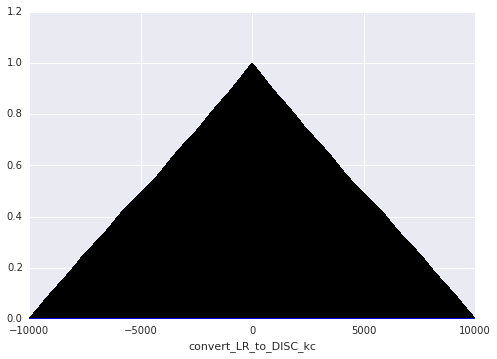

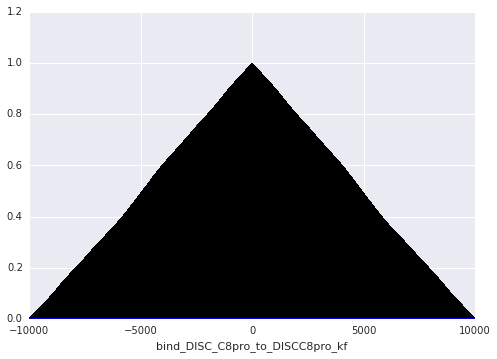

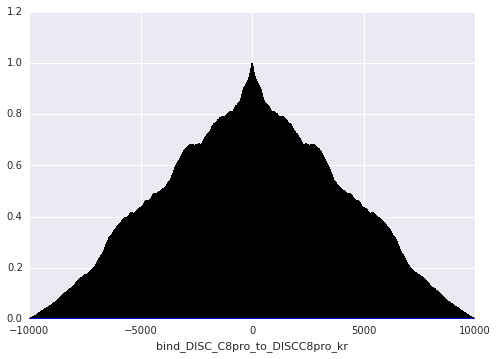

...

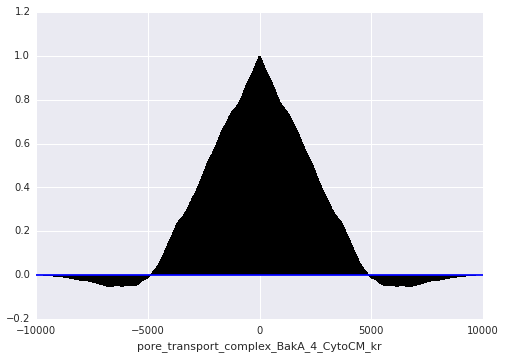

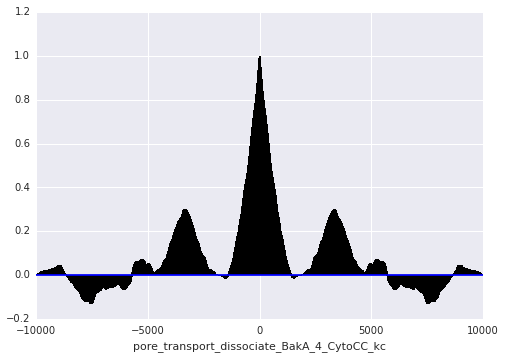

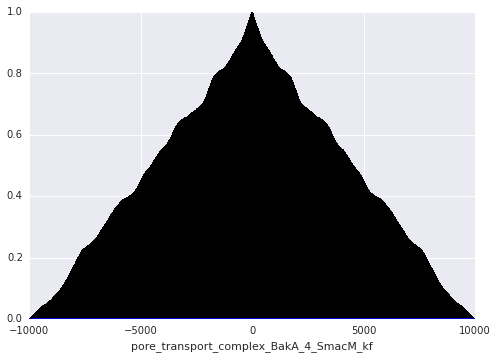

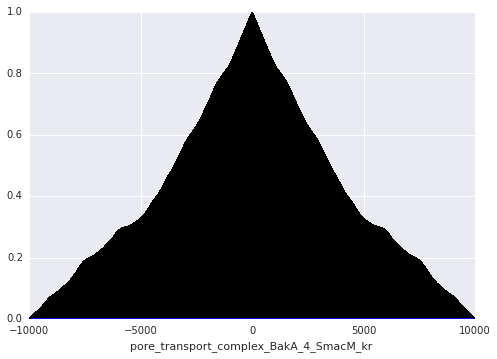

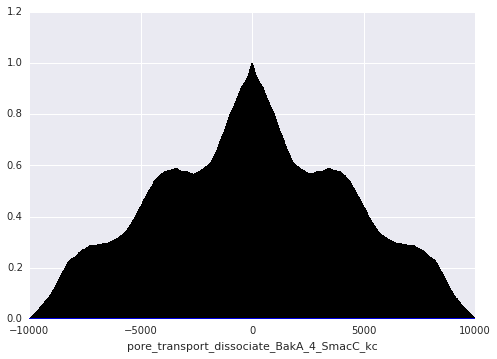

In [12]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

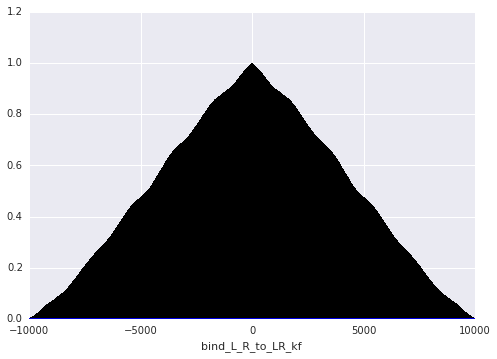

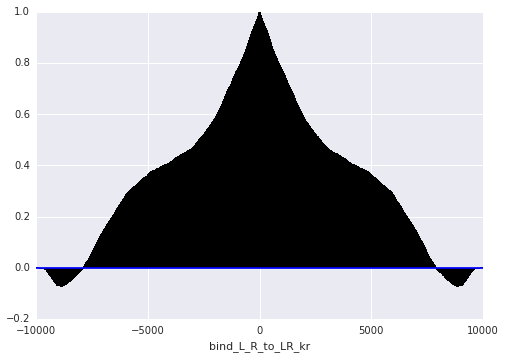

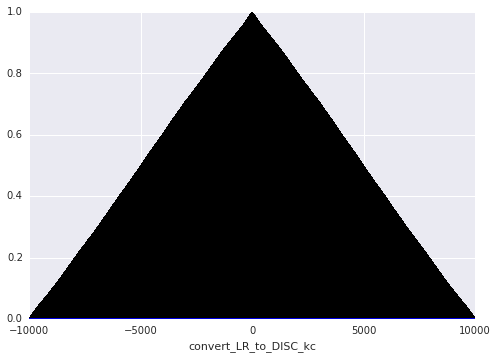

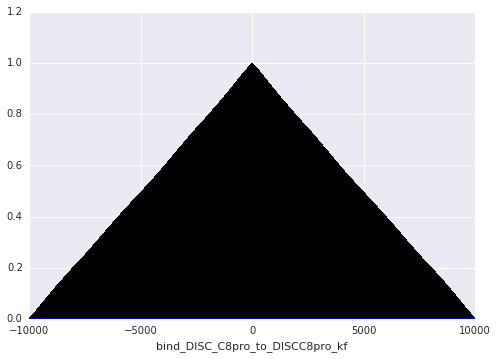

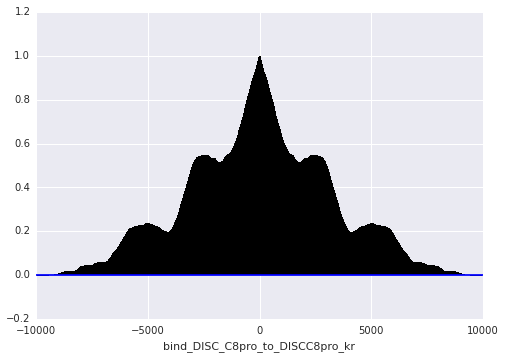

...

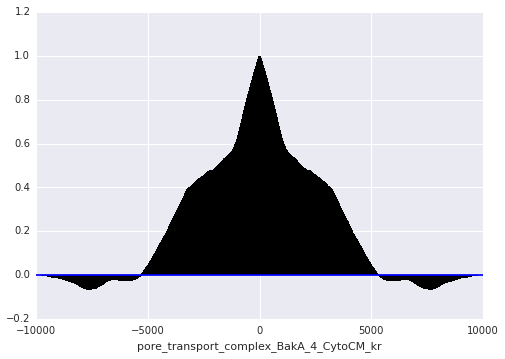

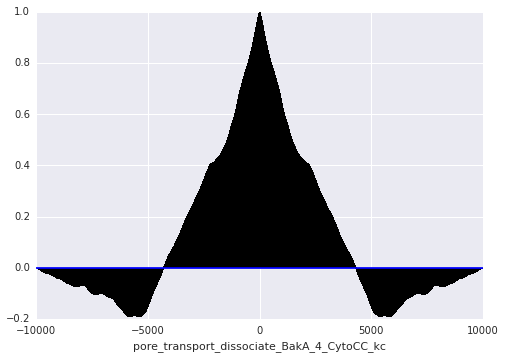

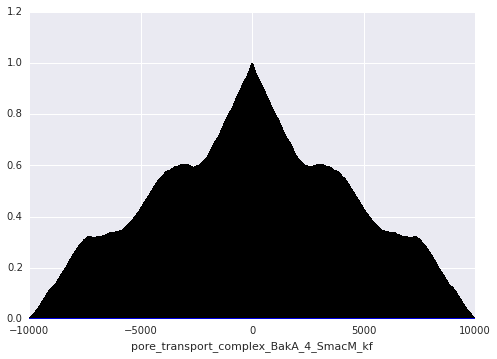

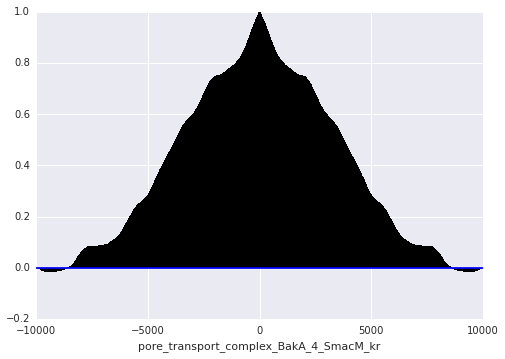

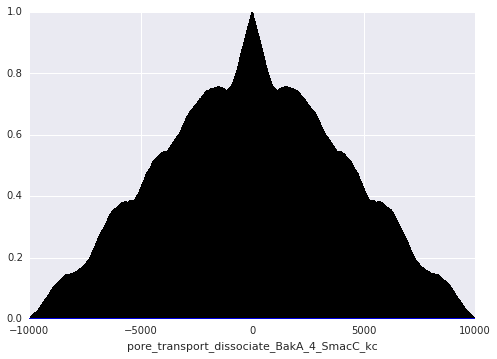

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

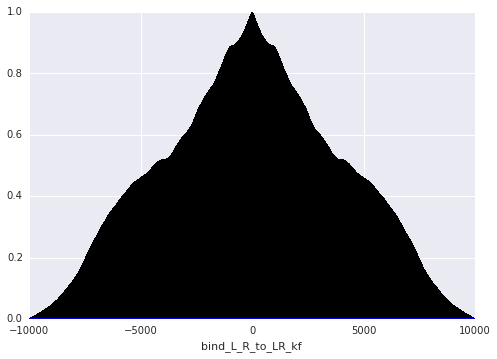

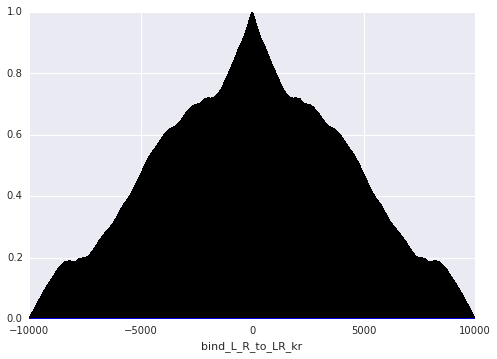

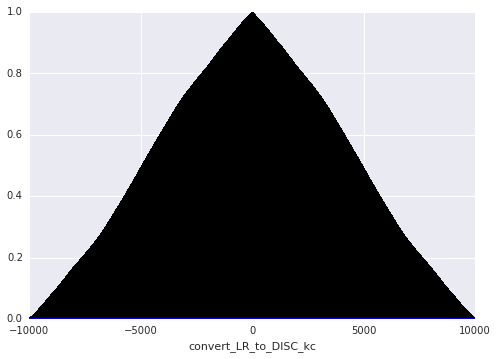

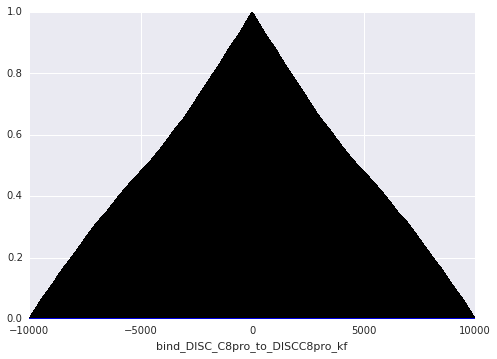

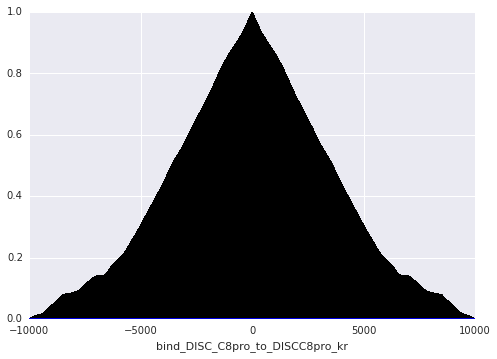

...

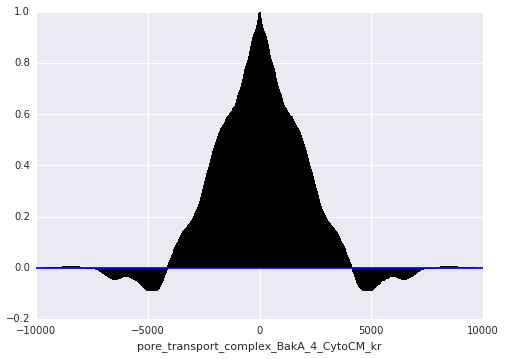

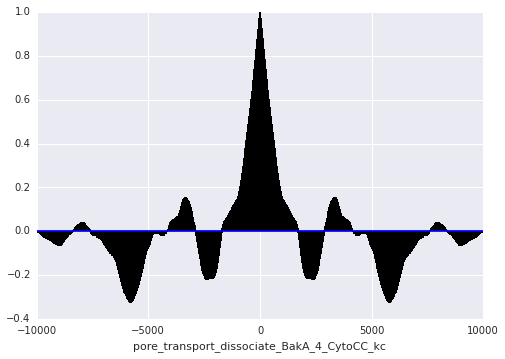

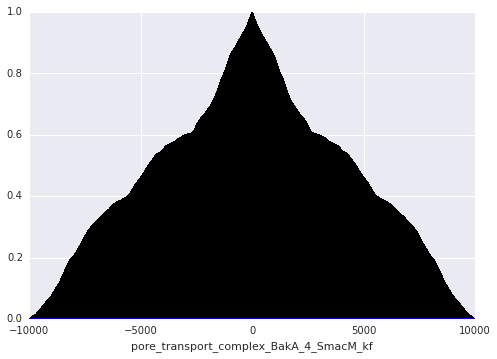

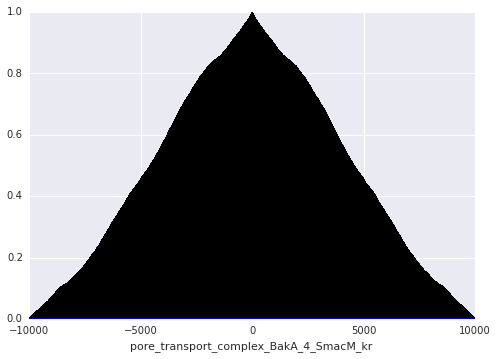

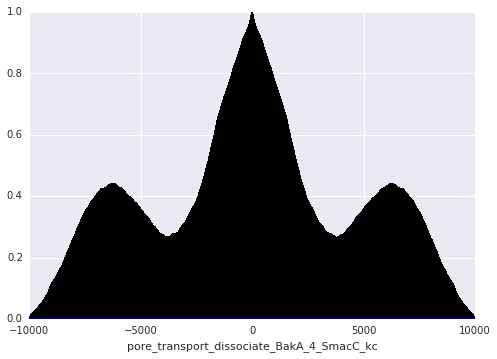

In [14]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [40]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['a'][0][0]), len(traces['a'][0])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][0][0]), 100))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['a'][0])))
running_acceptances_rates_vec_100window = np.zeros((1, 100))
for dim in range(len(traces['a'][0][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][0])):
        if dim == 0:
            comparison = traces['a'][0][iteration] == traces['a'][0][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['a'][0])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1203  acceptance rate:  0.1203
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1256  acceptance rate:  0.1256
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1133  acceptance rate:  0.1133
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1139  acceptance rate:  0.1139
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1225  acceptance rate:  0.1225
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1215  acceptance rate:  0.1215
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1190  acceptance rate:  0.119
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1172  acceptance rate:  0.1172
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1144  acceptance rate:  0.1144
N acceptances for parameter:  bind_DISC_flip_kf  =  1152  acceptance rate:  0.1152
N acceptances for parameter:  bind_DISC_flip_kr  =  1221  acceptance rate:  0.1221
N acce

array([[ 0.  ,  0.59,  0.59,  0.54,  0.51,  0.51,  0.47,  0.44,  0.46,
         0.42,  0.5 ,  0.47,  0.39,  0.38,  0.37,  0.38,  0.34,  0.41,
         0.33,  0.48,  0.36,  0.34,  0.41,  0.33,  0.33,  0.28,  0.25,
         0.31,  0.33,  0.25,  0.23,  0.27,  0.28,  0.27,  0.25,  0.23,
         0.2 ,  0.18,  0.15,  0.21,  0.18,  0.16,  0.22,  0.17,  0.18,
         0.2 ,  0.2 ,  0.16,  0.08,  0.21,  0.09,  0.12,  0.17,  0.1 ,
         0.12,  0.05,  0.13,  0.18,  0.09,  0.15,  0.1 ,  0.1 ,  0.15,
         0.17,  0.15,  0.05,  0.06,  0.06,  0.05,  0.13,  0.07,  0.1 ,
         0.11,  0.05,  0.06,  0.14,  0.11,  0.09,  0.1 ,  0.06,  0.07,
         0.12,  0.06,  0.12,  0.03,  0.08,  0.08,  0.06,  0.03,  0.11,
         0.07,  0.07,  0.07,  0.04,  0.03,  0.01,  0.03,  0.05,  0.06,
         0.01]])

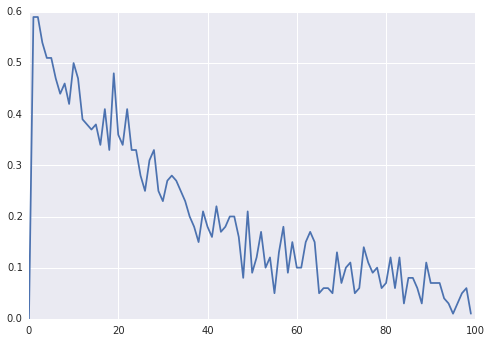

In [44]:
plt.plot(range(100), running_acceptances_rates_vec_100window[0,:])

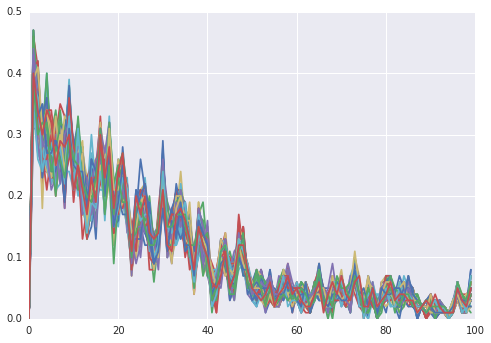

In [18]:
for dim in range(105):
    plt.plot(range(100), running_acceptance_rates_100window[dim, :])

In [19]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
running_acceptance_rates = np.zeros((len(traces['a'][1][0]), len(traces['a'][1])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][1][0]), 100))
for dim in range(len(traces['a'][1][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
running_acceptance_rates
running_acceptance_rates_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1091  acceptance rate:  0.1091
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1113  acceptance rate:  0.1113
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1034  acceptance rate:  0.1034
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1080  acceptance rate:  0.108
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1171  acceptance rate:  0.1171
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1112  acceptance rate:  0.1112
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1121  acceptance rate:  0.1121
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1084  acceptance rate:  0.1084
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1063  acceptance rate:  0.1063
N acceptances for parameter:  bind_DISC_flip_kf  =  1143  acceptance rate:  0.1143
N acceptances for parameter:  bind_DISC_flip_kr  =  1139  acceptance rate:  0.1139
N acce

array([[ 0.  ,  0.41,  0.35, ...,  0.04,  0.1 ,  0.03],
       [ 0.  ,  0.35,  0.28, ...,  0.06,  0.06,  0.04],
       [ 0.  ,  0.32,  0.33, ...,  0.04,  0.07,  0.04],
       ..., 
       [ 0.  ,  0.4 ,  0.3 , ...,  0.06,  0.07,  0.03],
       [ 0.  ,  0.37,  0.31, ...,  0.06,  0.06,  0.04],
       [ 0.  ,  0.37,  0.34, ...,  0.04,  0.08,  0.04]])

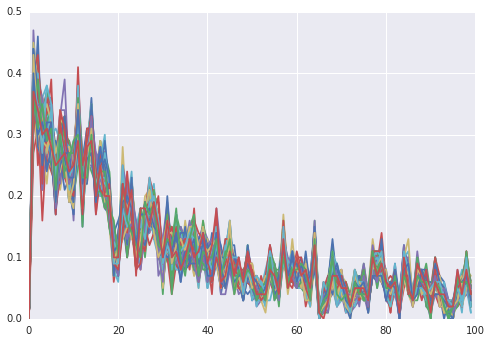

In [20]:
for dim in range(105):
    plt.plot(range(100), running_acceptance_rates_100window[dim, :])

In [22]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
running_acceptance_rates = np.zeros((len(traces['a'][2][0]), len(traces['a'][2])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][2][0]), 100))
for dim in range(len(traces['a'][2][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
running_acceptance_rates
running_acceptance_rates_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1077  acceptance rate:  0.1077
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1077  acceptance rate:  0.1077
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1036  acceptance rate:  0.1036
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1045  acceptance rate:  0.1045
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1028  acceptance rate:  0.1028
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1063  acceptance rate:  0.1063
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1048  acceptance rate:  0.1048
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1069  acceptance rate:  0.1069
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1040  acceptance rate:  0.104
N acceptances for parameter:  bind_DISC_flip_kf  =  1104  acceptance rate:  0.1104
N acceptances for parameter:  bind_DISC_flip_kr  =  1047  acceptance rate:  0.1047
N acce

array([[ 0.  ,  0.44,  0.39, ...,  0.02,  0.03,  0.04],
       [ 0.  ,  0.4 ,  0.39, ...,  0.01,  0.02,  0.03],
       [ 0.  ,  0.37,  0.35, ...,  0.04,  0.04,  0.05],
       ..., 
       [ 0.  ,  0.4 ,  0.33, ...,  0.03,  0.03,  0.05],
       [ 0.  ,  0.38,  0.3 , ...,  0.04,  0.03,  0.06],
       [ 0.  ,  0.4 ,  0.34, ...,  0.03,  0.02,  0.05]])

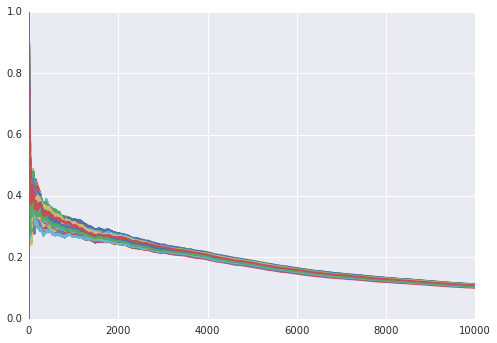

In [23]:
for dim in range(105):
    plt.plot(range(10000), running_acceptance_rates[dim,:])

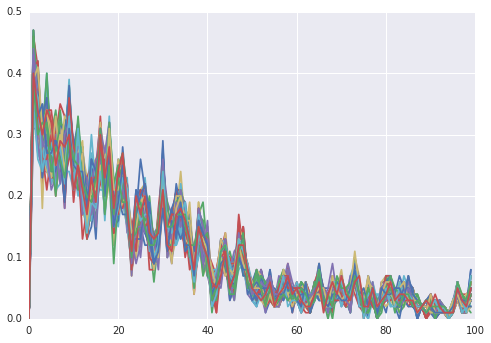

In [24]:
for dim in range(105):
    plt.plot(range(100), running_acceptance_rates_100window[dim, :])